# Project Overview
This notebook focuses on processing and analyzing a dataset related to Amazon Prime titles. It covers data cleaning, feature engineering, encoding, and model training steps to predict age ratings.


# Importing Important Libraries
The following code imports essential libraries for data manipulation, visualization, and machine learning. Libraries include:
- `pandas` for handling dataframes.
- `numpy` for numerical computations.
- `matplotlib` and `seaborn` for data visualization.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Reading the Dataset
The dataset is loaded to explore the TV shows and movies available on Amazon Prime. It includes features such as title, type, release year, rating, and more.


In [2]:
df = pd.read_csv('amazon_prime_titles.csv')

In [3]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,The Grand Seduction,Don McKellar,"Brendan Gleeson, Taylor Kitsch, Gordon Pinsent",Canada,"March 30, 2021",2014,NaN,113 min,"Comedy, Drama",A small fishing village must procure a local d...
1,s2,Movie,Take Care Good Night,Girish Joshi,"Mahesh Manjrekar, Abhay Mahajan, Sachin Khedekar",India,"March 30, 2021",2018,13+,110 min,"Drama, International",A Metro Family decides to fight a Cyber Crimin...
2,s3,Movie,Secrets of Deception,Josh Webber,"Tom Sizemore, Lorenzo Lamas, Robert LaSardo, R...",United States,"March 30, 2021",2017,NaN,74 min,"Action, Drama, Suspense",After a man discovers his wife is cheating on ...
3,s4,Movie,Pink: Staying True,Sonia Anderson,"Interviews with: Pink, Adele, Beyoncé, Britney...",United States,"March 30, 2021",2014,NaN,69 min,Documentary,"Pink breaks the mold once again, bringing her ..."
4,s5,Movie,Monster Maker,Giles Foster,"Harry Dean Stanton, Kieran O'Brien, George Cos...",United Kingdom,"March 30, 2021",1989,NaN,45 min,"Drama, Fantasy",Teenage Matt Banting wants to work with a famo...


# Dropping the ID since it is unique in all rows

In [4]:
print(f"Number of Records in the Dataset is: {len(df)}.")
print(f"Number of Unique Values in the show_id column is: {len(df['show_id'].unique())}.")

Number of Records in the Dataset is: 9668.
Number of Unique Values in the show_id column is: 9668.


In [5]:
df.drop(columns=['show_id'], inplace=True)

# Checking for Missing Values
Null values are handled by either removing columns with excessive missing data or imputing values where appropriate. This ensures a consistent dataset for analysis.

The following cell shows a huge amount of null values for a dataset having around 9.5 thousand records.

In [6]:
df.isna().sum().sum()

22162

In [7]:
len(df)

9668

# Checking Missing Values
The following code cell shows that some features have a lot of null values compared to other features.

In [8]:
df.isna().sum()

,0
type,0
title,0
director,2083
cast,1233
country,8996
date_added,9513
release_year,0
rating,337
duration,0
listed_in,0


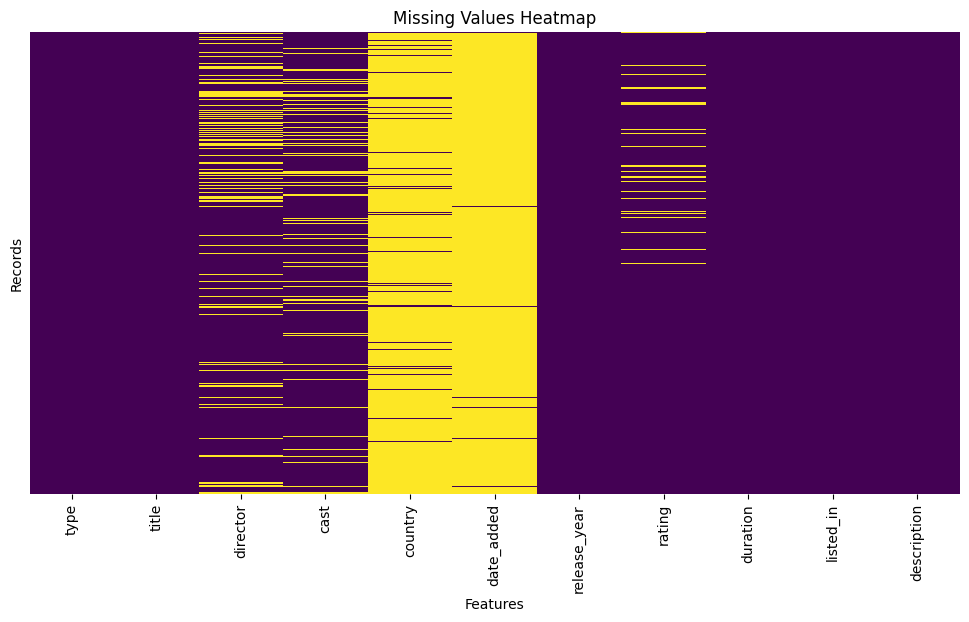

In [9]:
plt.figure(figsize=(12, 6))
sns.heatmap(df.isna(), cbar=False, cmap='viridis', yticklabels=False)
plt.title("Missing Values Heatmap")
plt.xlabel("Features")
plt.ylabel("Records")
plt.show()

# Dealing with Missing Values
Since the dataset has 9668 records, and the country feature has 8996 missing values out of 9668, representing approximately 93% of the whole dataset, it is better to drop this feature. The same goes for the "date_added" feature, as its missing entries represent approximately 98% of the whole dataset. As for the other features that have missing values, such as cast, and director, I will impute them with "unknown" initially to check their importance.Finally, the rating feature, which is my target feature, will be imputed with "NR", which means unrated, to avoid noise.

In [10]:
df = df.drop(columns=['country'], axis=1,) # Dropping the country feature
df = df.drop(columns=['date_added'], axis=1) # Dropping the date_added feature

# Imputing the director and cast with unkown
df['director'] = df['director'].fillna("unknown")
df['cast'] = df['cast'].fillna("unknown")


df['rating'] = df['rating'].fillna("NR") # Imputing the rating feature with NR (not rated)

In [11]:
df.isna().sum()

,0
type,0
title,0
director,0
cast,0
release_year,0
rating,0
duration,0
listed_in,0
description,0


# Checking for Consistency of Ratings
Checking for incosistent values in the feature "rating". As illustrated below, this feature has many incosistent values. For example, it has "UNRATED", "NR", "NOT_RATE", which all mean the same thing. Moreover, the system used for rating movies is different from TV shows. I am using the MPAA system for movies, and the TV Parental Guidelines for TV shows.

Ratings are standardized to ensure consistency across movies and TV shows. This step is crucial for accurate predictions in machine learning models.


In [12]:
df['rating'].unique()

array(['NR', '13+', 'ALL', '18+', 'R', 'TV-Y', 'TV-Y7', '16+', 'TV-PG',
       '7+', 'TV-14', 'TV-NR', 'TV-G', 'PG-13', 'TV-MA', 'G', 'PG',
       'NC-17', 'UNRATED', '16', 'AGES_16_', 'AGES_18_', 'ALL_AGES',
       'NOT_RATE'], dtype=object)

In [13]:
df[df['type'] == 'Movie']['rating'].unique()

array(['NR', '13+', 'R', 'ALL', '18+', 'PG-13', '16+', '7+', 'G', 'PG',
       'NC-17', 'UNRATED', '16', 'AGES_16_', 'AGES_18_', 'ALL_AGES',
       'NOT_RATE'], dtype=object)

In [14]:
df[df['type'] == 'TV Show']['rating'].unique()

array(['ALL', '18+', 'TV-Y', 'TV-Y7', '16+', 'TV-PG', '13+', '7+',
       'TV-14', 'TV-NR', 'TV-G', 'TV-MA', 'NR'], dtype=object)

As illustrated above, the age rating are not consistent, which may lead to inaccurate predictions. So, I will map these ratings to an appropriate and structured classification system, MPAA for movies, and TV Parental Guidelines Categories.

In [ ]:
def standardize_rating(rating, content_type):
    # Movie ratings mapping
    movie_ratings = {
        'G': 'G',
        'PG': 'PG',
        'PG-13': 'PG-13',
        'R': 'R',
        'NC-17': 'NC-17',
        '13+': 'PG-13',
        '16+': 'R',
        '18+': 'NC-17',
        'AGES_16_': 'R',
        'AGES_18_': 'NC-17',
        'ALL': 'G',         
        'ALL_AGES': 'G',    
    }

    # TV show ratings mapping
    tv_ratings = {
        'TV-Y': 'TV-Y',
        'TV-Y7': 'TV-Y7',
        'TV-G': 'TV-G',
        'TV-PG': 'TV-PG',
        'TV-14': 'TV-14',
        'TV-MA': 'TV-MA',
        '7+': 'TV-Y7',      
        '13+': 'TV-14',     
        '16+': 'TV-14',    
        '18+': 'TV-MA',    
    }

    # Non-rated mapping
    non_rated = ['NR', 'UNRATED', 'NOT_RATE', None]

    # Standardize based on content type
    if rating in non_rated:
        return 'NR'
    elif content_type == 'Movie':
        return movie_ratings.get(rating, 'NR')  # Default to 'NR' if not found
    elif content_type == 'TV Show':
        return tv_ratings.get(rating, 'NR')     # Default to 'NR' if not found
    else:
        return 'NR'

In [16]:
df['rating'] = df.apply(lambda row: standardize_rating(row['rating'], row['type']), axis=1)

In [17]:
print("All unique ratings:", df['rating'].unique())
print("Movies unique ratings:", df[df['type'] == 'Movie']['rating'].unique())
print("TV shows unique ratings:", df[df['type'] == 'TV Show']['rating'].unique())

All unique ratings: ['NR' 'PG-13' 'TV-MA' 'R' 'TV-Y' 'TV-Y7' 'G' 'TV-14' 'TV-PG' 'NC-17'
 'TV-G' 'PG']
Movies unique ratings: ['NR' 'PG-13' 'R' 'G' 'NC-17' 'PG']
TV shows unique ratings: ['NR' 'TV-MA' 'TV-Y' 'TV-Y7' 'TV-14' 'TV-PG' 'TV-G']


# Feature Engineering

Feature engineering involves renaming columns, extracting numerical data, and encoding multi-valued features for effective use in machine learning models.


# Changing Feature Names
There is a feature named "listed_in", which refers to the genres of the show, A better name for it would be "genres".

In [18]:
df.rename(columns={'listed_in': 'genres'}, inplace=True)

In [19]:
df.head()

,type,title,director,cast,release_year,rating,duration,genres,description
0,Movie,The Grand Seduction,Don McKellar,"Brendan Gleeson, Taylor Kitsch, Gordon Pinsent",2014,NR,113 min,"Comedy, Drama",A small fishing village must procure a local d...
1,Movie,Take Care Good Night,Girish Joshi,"Mahesh Manjrekar, Abhay Mahajan, Sachin Khedekar",2018,PG-13,110 min,"Drama, International",A Metro Family decides to fight a Cyber Crimin...
2,Movie,Secrets of Deception,Josh Webber,"Tom Sizemore, Lorenzo Lamas, Robert LaSardo, R...",2017,NR,74 min,"Action, Drama, Suspense",After a man discovers his wife is cheating on ...
3,Movie,Pink: Staying True,Sonia Anderson,"Interviews with: Pink, Adele, Beyoncé, Britney...",2014,NR,69 min,Documentary,"Pink breaks the mold once again, bringing her ..."
4,Movie,Monster Maker,Giles Foster,"Harry Dean Stanton, Kieran O'Brien, George Cos...",1989,NR,45 min,"Drama, Fantasy",Teenage Matt Banting wants to work with a famo...


## Checking duration Feature Values
As illustrated above, this feature has a number followed by "min" which stands for minutes. Let's see the unique textual values, such as "min" in this feature, to see the difference in them between the 2 types, movies and TV shows.

In [20]:
df['duration'].str.split().str[-1].unique()

array(['min', 'Season', 'Seasons'], dtype=object)

# Removing Textual Values
The following code cell removes strings like min, Season, and Seasons from the duration column. And since the dataset will be separated into 2 parts before modeling, the issue of having duration represented in minutes in movies, and in seasons in TV shows, will not cause an issue, as each type is trained and evaluated separately. The following code cell defines a function that extract numbers from the duration feature.

In [21]:
import re

def extract_numbers(value):
    # Convert to string and search for numbers
    match = re.search(r'\d+', str(value))
    # Return the matched numbers if found, else return None
    return int(match.group(0)) if match else None

In [22]:
df['duration'] = df['duration'].apply(extract_numbers)

In [23]:
df.head()

,type,title,director,cast,release_year,rating,duration,genres,description
0,Movie,The Grand Seduction,Don McKellar,"Brendan Gleeson, Taylor Kitsch, Gordon Pinsent",2014,NR,113,"Comedy, Drama",A small fishing village must procure a local d...
1,Movie,Take Care Good Night,Girish Joshi,"Mahesh Manjrekar, Abhay Mahajan, Sachin Khedekar",2018,PG-13,110,"Drama, International",A Metro Family decides to fight a Cyber Crimin...
2,Movie,Secrets of Deception,Josh Webber,"Tom Sizemore, Lorenzo Lamas, Robert LaSardo, R...",2017,NR,74,"Action, Drama, Suspense",After a man discovers his wife is cheating on ...
3,Movie,Pink: Staying True,Sonia Anderson,"Interviews with: Pink, Adele, Beyoncé, Britney...",2014,NR,69,Documentary,"Pink breaks the mold once again, bringing her ..."
4,Movie,Monster Maker,Giles Foster,"Harry Dean Stanton, Kieran O'Brien, George Cos...",1989,NR,45,"Drama, Fantasy",Teenage Matt Banting wants to work with a famo...


# Checking for Imbalance

There may be some values that dominate other values, as they are repeated most within a column/feature. As illustrated below, there is a significant imbalance the "type" feature, where movies have 7814 entries, representing approximately 81% of the whole column. This imbalanced introduced another imbalance in the rating feature, as each type, movies or TV shows, has a different rating system. I will deal with this by sperating the dataset into 2 parts, one for each type. This step will be done after data preparation and right before model training.

In [24]:
type_counts = df['type'].value_counts()
rating_distribution_movies = df[df['type'] == 'Movie']['rating'].value_counts()
rating_distribution_tv_shows = df[df['type'] == 'TV Show']['rating'].value_counts()

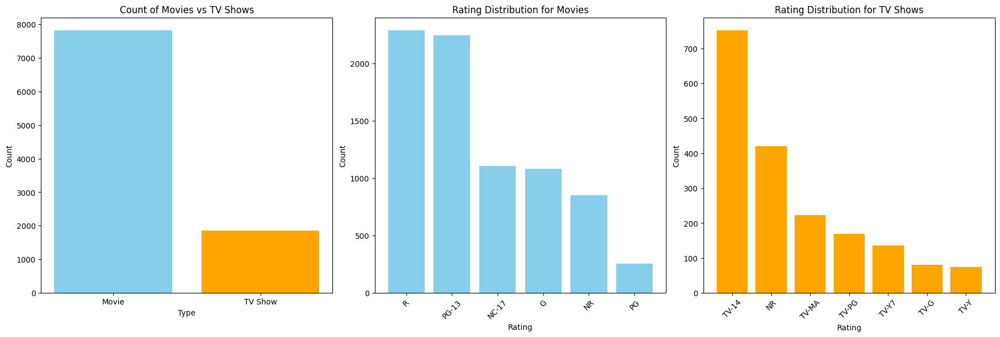

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Plot 1: Bar chart for type counts
axes[0].bar(type_counts.index, type_counts.values, color=['skyblue', 'orange'])
axes[0].set_title("Count of Movies vs TV Shows")
axes[0].set_xlabel("Type")
axes[0].set_ylabel("Count")

# Plot 2: Rating distribution for Movies
axes[1].bar(rating_distribution_movies.index, rating_distribution_movies.values, color='skyblue')
axes[1].set_title("Rating Distribution for Movies")
axes[1].set_xlabel("Rating")
axes[1].set_ylabel("Count")
axes[1].tick_params(axis='x', rotation=45)

# Plot 3: Rating distribution for TV Shows
axes[2].bar(rating_distribution_tv_shows.index, rating_distribution_tv_shows.values, color='orange')
axes[2].set_title("Rating Distribution for TV Shows")
axes[2].set_xlabel("Rating")
axes[2].set_ylabel("Count")
axes[2].tick_params(axis='x', rotation=45)


plt.show()

In [26]:
print(f"Values count for 'type': {df['type'].value_counts()}")
print(f"Values count for 'rating': {df['rating'].value_counts()}")

Values count for 'type': type
Movie      7814
TV Show    1854
Name: count, dtype: int64
Values count for 'rating': rating
R        2284
PG-13    2242
NR       1270
NC-17    1103
G        1082
TV-14     751
PG        253
TV-MA     223
TV-PG     169
TV-Y7     136
TV-G       81
TV-Y       74
Name: count, dtype: int64


## Preprocessing Textual Features
Textual features, such as genres, description, cast, and other textual features need to be converted to numerical values before proceeding to further steps.

## Encoding Categorical Features
These features have fixed classes, unlike the description feature, for example, that has plain text (no specific categories). These features are dealt with in a specific way, which is encoding. However, I first need to check whether those categorical features are multi-valued or not, i.e., whether they have multiple comma-separated classes in one entry.

In [27]:
df.head()

,type,title,director,cast,release_year,rating,duration,genres,description
0,Movie,The Grand Seduction,Don McKellar,"Brendan Gleeson, Taylor Kitsch, Gordon Pinsent",2014,NR,113,"Comedy, Drama",A small fishing village must procure a local d...
1,Movie,Take Care Good Night,Girish Joshi,"Mahesh Manjrekar, Abhay Mahajan, Sachin Khedekar",2018,PG-13,110,"Drama, International",A Metro Family decides to fight a Cyber Crimin...
2,Movie,Secrets of Deception,Josh Webber,"Tom Sizemore, Lorenzo Lamas, Robert LaSardo, R...",2017,NR,74,"Action, Drama, Suspense",After a man discovers his wife is cheating on ...
3,Movie,Pink: Staying True,Sonia Anderson,"Interviews with: Pink, Adele, Beyoncé, Britney...",2014,NR,69,Documentary,"Pink breaks the mold once again, bringing her ..."
4,Movie,Monster Maker,Giles Foster,"Harry Dean Stanton, Kieran O'Brien, George Cos...",1989,NR,45,"Drama, Fantasy",Teenage Matt Banting wants to work with a famo...


## Multi-Valued Features
As shown below, the features director, cast, and genres are multi-valued, where as the feature rating is single-valued.

In [28]:
pd.set_option("display.max_rows", None)
df['director'].value_counts()

,count
director,
unknown,2083
Mark Knight,113
Cannis Holder,61
Moonbug Entertainment,37
Jay Chapman,34
Arthur van Merwijk,30
Manny Rodriguez,22
John English,20
1,16


In [29]:
df['genres'].value_counts()

,count
genres,
Drama,986
Comedy,536
"Drama, Suspense",399
"Comedy, Drama",377
"Animation, Kids",356
Documentary,350
Kids,334
"Action, Drama",297
"Documentary, Special Interest",296


In [30]:
df['cast'].value_counts()

,count
cast,
unknown,1233
Maggie Binkley,56
1,34
Anne-Marie Newland,24
Cassandra Peterson,21
"Grace Tamayo, Erin Webbs",17
"Gene Autry, Champion, Gail Davis",12
Stevin John,11
"LB, Aaron Michael",9


In [31]:
df['rating'].value_counts()

,count
rating,
R,2284
PG-13,2242
NR,1270
NC-17,1103
G,1082
TV-14,751
PG,253
TV-MA,223
TV-PG,169


In [32]:
df['type'].value_counts()

,count
type,
Movie,7814
TV Show,1854


## Encoding Categorical Features
As illustrated above, the features director, cast, and genres are categorical multi-valued features. Rating, on the other hand, is a categorical single-valued feature. Single and multi valued features differ in encoding. Multi-Label binarizer is used for categorical multi-valued features in my dataframe,whereas label encoder (binary encoder) is used on the categorical single-valued features, namely, rating and type, in my dataframe.

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

def encode_multivalued_feature(df, column_name):
    
    df[column_name + '_list'] = df[column_name].apply(lambda x: [item.strip() for item in str(x).split(',')])

    mlb = MultiLabelBinarizer()

    encoded = mlb.fit_transform(df[column_name + '_list'])
    encoded_df = pd.DataFrame(encoded, columns=[f"{column_name}_{cls}" for cls in mlb.classes_])

    df = pd.concat([df, encoded_df], axis=1)

    df.drop(columns=[column_name + '_list'], inplace=True)

    return df

df = encode_multivalued_feature(df, 'genres')
df = encode_multivalued_feature(df, 'director')
df = encode_multivalued_feature(df, 'cast')


In [34]:
df.drop(columns=['director', 'genres', 'cast'], inplace=True)

In [ ]:
from sklearn.preprocessing import LabelEncoder

movies_data = df[df['type'] == 'Movie']
tv_shows_data = df[df['type'] == 'TV Show']

movie_rating_encoder = LabelEncoder()
tv_show_rating_encoder = LabelEncoder()

movies_data['rating'] = movie_rating_encoder.fit_transform(movies_data['rating'])
tv_shows_data['rating'] = tv_show_rating_encoder.fit_transform(tv_shows_data['rating'])

df = pd.concat([movies_data, tv_shows_data], axis=0).sort_index()

df.head()

<ipython-input-35-8ff1a736ec00>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movies_data['rating'] = movie_rating_encoder.fit_transform(movies_data['rating'])
<ipython-input-35-8ff1a736ec00>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_shows_data['rating'] = tv_show_rating_encoder.fit_transform(tv_shows_data['rating'])


,type,title,release_year,rating,duration,description,genres_Action,genres_Adventure,genres_Animation,genres_Anime,...,cast_月亭太遊,cast_渡辺厚人,cast_澤田由衣,cast_真弓,cast_篠崎雅美,cast_美村多栄,cast_辰寿広美,cast_辻凪子,cast_辻葉子,cast_齋藤雅弘
0,Movie,The Grand Seduction,2014,2,113,A small fishing village must procure a local d...,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Movie,Take Care Good Night,2018,4,110,A Metro Family decides to fight a Cyber Crimin...,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Movie,Secrets of Deception,2017,2,74,After a man discovers his wife is cheating on ...,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Movie,Pink: Staying True,2014,2,69,"Pink breaks the mold once again, bringing her ...",0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Movie,Monster Maker,1989,2,45,Teenage Matt Banting wants to work with a famo...,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
type_encoder = LabelEncoder()
df['type'] = type_encoder.fit_transform(df['type'])

In [37]:
df.head()

,type,title,release_year,rating,duration,description,genres_Action,genres_Adventure,genres_Animation,genres_Anime,...,cast_月亭太遊,cast_渡辺厚人,cast_澤田由衣,cast_真弓,cast_篠崎雅美,cast_美村多栄,cast_辰寿広美,cast_辻凪子,cast_辻葉子,cast_齋藤雅弘
0,0,The Grand Seduction,2014,2,113,A small fishing village must procure a local d...,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,Take Care Good Night,2018,4,110,A Metro Family decides to fight a Cyber Crimin...,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,Secrets of Deception,2017,2,74,After a man discovers his wife is cheating on ...,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,Pink: Staying True,2014,2,69,"Pink breaks the mold once again, bringing her ...",0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,Monster Maker,1989,2,45,Teenage Matt Banting wants to work with a famo...,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Vectorization
There are textual features that do not contain classes/categories, such as title, and description. They are dealt with differently from the categorical features. In other words, we need to vectorize them (convert them into vectors of numbers) for the models to process them. However, we need to preprocess these textual features before we vectorize them.However, since titles are short and may not provide useful information on their own, I will combine them with the description before vectorization.

In [38]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
def preprocess_text(text):

    text = text.lower()
    # Remove punctuation, numbers, and extra spaces
    text = re.sub(r"[^\w\s]", '', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\s+', ' ', text)

    stop_words = set(stopwords.words('english')) - {"not", "haven't", "hasn't", "hadn't",
                                                    "can't", "cannot", "isn't", "aren't", "wasn't", "weren't"}
    text = ' '.join(word for word in text.split() if word not in stop_words)

    lemmatizer = WordNetLemmatizer()
    text = ' '.join(lemmatizer.lemmatize(word) for word in text.split())
    return text

In [40]:
df['description'] = df['description'].apply(preprocess_text)
df['title'] = df['title'].str.lower()

In [41]:
df['title_description'] = df['title'] + ' ' + df['description']

In [42]:
type_encoder.inverse_transform(df['type'])

array(['Movie', 'Movie', 'Movie', ..., 'Movie', 'TV Show', 'Movie'],
      dtype=object)

In [43]:
np.array(df['type'])

array([0, 0, 0, ..., 0, 1, 0])

In [ ]:
from sklearn.preprocessing import MinMaxScaler

minmax_scaler = MinMaxScaler()
df['release_year'] = minmax_scaler.fit_transform(df[['release_year']])


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from scipy.sparse import vstack

tfidf_vectorizer = TfidfVectorizer(max_features=2000)

chunk_size = 1000  
tfidf_matrix_chunks = []

for i in range(0, len(df), chunk_size):
    chunk = df['title_description'][i:i + chunk_size]
    tfidf_matrix_chunk = tfidf_vectorizer.fit_transform(chunk)
    tfidf_matrix_chunks.append(tfidf_matrix_chunk)

tfidf_matrix = vstack(tfidf_matrix_chunks)

del tfidf_matrix_chunks  

tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

pca = PCA(n_components=0.80, random_state=42)  


tfidf_pca = pca.fit_transform(tfidf_df)

tfidf_pca_df = pd.DataFrame(tfidf_pca, index=df.index, columns=[f'pca_{i}' for i in range(tfidf_pca.shape[1])])


tfidf_pca_df.head()

,pca_0,pca_1,pca_2,pca_3,pca_4,pca_5,pca_6,pca_7,pca_8,pca_9,...,pca_1200,pca_1201,pca_1202,pca_1203,pca_1204,pca_1205,pca_1206,pca_1207,pca_1208,pca_1209
0,-0.002583,0.010392,-0.003245,-0.020081,0.018203,0.054054,0.018184,0.036603,-0.001899,0.036863,...,-0.019580,0.002006,-0.021769,0.012715,-0.012419,-0.034108,-0.000808,-0.003879,0.012129,0.008466
1,0.041298,0.016723,-0.011854,-0.001270,0.010208,0.046676,0.052699,0.005073,0.005089,0.054508,...,0.022286,-0.007266,-0.003036,-0.019193,-0.002223,-0.003940,-0.002930,-0.001030,0.031273,0.028162
2,0.009928,0.018188,-0.010182,-0.014179,0.014073,0.076046,0.023113,0.020390,0.042137,0.046640,...,-0.002470,-0.023054,-0.013526,0.011243,-0.018410,-0.004977,-0.018703,0.023788,-0.004137,0.012253
3,-0.000812,0.018511,-0.016505,0.006195,0.010496,0.035053,-0.003148,0.038848,0.004437,0.042970,...,0.006008,-0.024452,-0.008022,0.003428,-0.009113,-0.002491,-0.014355,-0.017071,0.000768,-0.004035
4,-0.003875,-0.003392,0.002917,-0.025762,0.041812,0.012671,-0.026174,0.039152,0.046018,0.039873,...,0.009018,0.012132,-0.013604,-0.013060,-0.013998,0.012497,0.007594,-0.001964,-0.026650,-0.011425


In [46]:
df.drop(columns=['title_description', 'title', 'description'], inplace=True)
df = pd.concat([df, tfidf_pca_df], axis=1)

In [47]:
df.head()

,type,release_year,rating,duration,genres_Action,genres_Adventure,genres_Animation,genres_Anime,genres_Arthouse,genres_Arts,...,pca_1200,pca_1201,pca_1202,pca_1203,pca_1204,pca_1205,pca_1206,pca_1207,pca_1208,pca_1209
0,0,0.930693,2,113,0,0,0,0,0,0,...,-0.019580,0.002006,-0.021769,0.012715,-0.012419,-0.034108,-0.000808,-0.003879,0.012129,0.008466
1,0,0.970297,4,110,0,0,0,0,0,0,...,0.022286,-0.007266,-0.003036,-0.019193,-0.002223,-0.003940,-0.002930,-0.001030,0.031273,0.028162
2,0,0.960396,2,74,1,0,0,0,0,0,...,-0.002470,-0.023054,-0.013526,0.011243,-0.018410,-0.004977,-0.018703,0.023788,-0.004137,0.012253
3,0,0.930693,2,69,0,0,0,0,0,0,...,0.006008,-0.024452,-0.008022,0.003428,-0.009113,-0.002491,-0.014355,-0.017071,0.000768,-0.004035
4,0,0.683168,2,45,0,0,0,0,0,0,...,0.009018,0.012132,-0.013604,-0.013060,-0.013998,0.012497,0.007594,-0.001964,-0.026650,-0.011425


# Handling Imbalance

In [48]:
df_movies = df[df['type'] == type_encoder.transform(['Movie'])[0]]
df_tv = df[df['type'] == type_encoder.transform(['TV Show'])[0]]

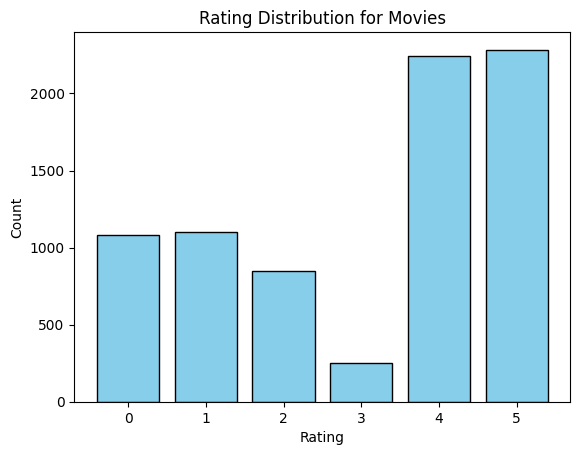

In [ ]:
movies_rating_counts = df_movies['rating'].value_counts()

plt.bar(movies_rating_counts.index, movies_rating_counts.values, color='skyblue', edgecolor='black')
plt.title('Rating Distribution for Movies')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.xticks(movies_rating_counts.index) 
plt.show()

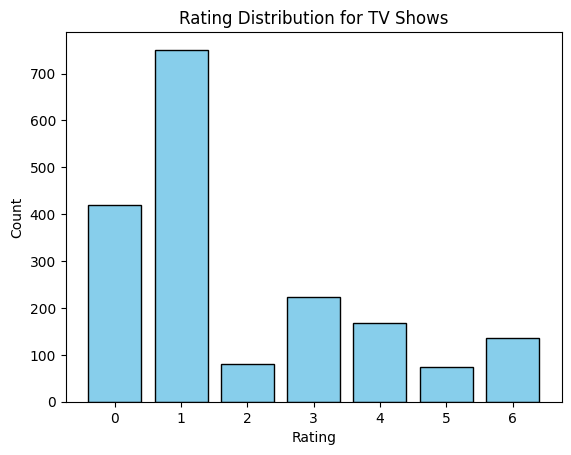

In [ ]:
tv_rating_counts = df_tv['rating'].value_counts()

plt.bar(tv_rating_counts.index, tv_rating_counts.values, color='skyblue', edgecolor='black')
plt.title('Rating Distribution for TV Shows')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.xticks(tv_rating_counts.index)  
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

X_movies = df_movies.drop(columns=['rating'])
y_movies = df_movies['rating'].astype(int)

X_train_movies, X_test_movies, y_train_movies, y_test_movies = train_test_split(X_movies, y_movies, test_size=0.2, random_state=42, stratify = df_movies['rating'])

X_tv = df_tv.drop(columns=['rating'])
y_tv = df_tv['rating'].astype(int)

X_train_tv, X_test_tv, y_train_tv, y_test_tv = train_test_split(X_tv, y_tv, test_size=0.2, random_state=42, stratify = df_tv['rating'])

In [52]:
from imblearn.over_sampling import SMOTE

smote_movies = SMOTE(random_state = 42)

smote_tv = SMOTE(random_state = 43)

X_train_movies, y_train_movies = smote_movies.fit_resample(X_train_movies, y_train_movies)
X_train_tv, y_train_tv = smote_tv.fit_resample(X_train_tv, y_train_tv)

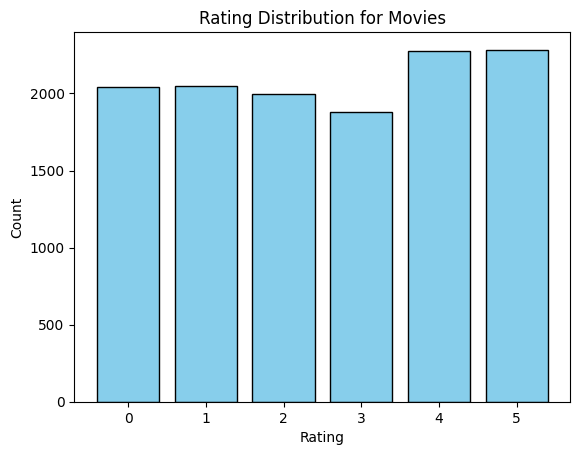

In [ ]:
movies_rating_counts = pd.concat([y_train_movies, y_test_movies]).value_counts()

plt.bar(movies_rating_counts.index, movies_rating_counts.values, color='skyblue', edgecolor='black')
plt.title('Rating Distribution for Movies')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.xticks(movies_rating_counts.index) 
plt.show()

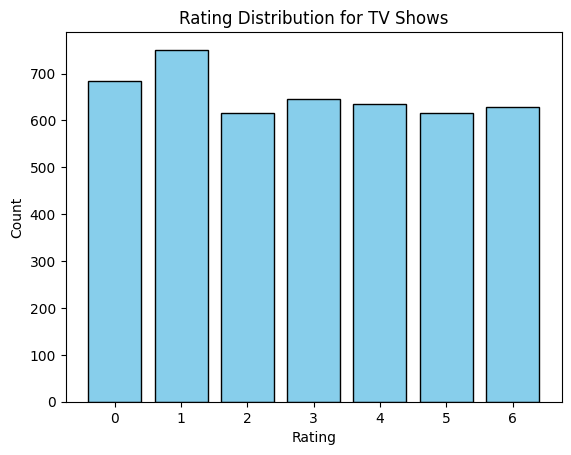

In [ ]:
tv_rating_counts = pd.concat([y_train_tv, y_test_tv]).value_counts()

plt.bar(tv_rating_counts.index, tv_rating_counts.values, color='skyblue', edgecolor='black')
plt.title('Rating Distribution for TV Shows')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.xticks(tv_rating_counts.index)  
plt.show()

# Model Training and Feature Selection

Different machine learning models, such as Random Forest, Decision Trees, and Logistic Regression, are trained to predict age ratings. Metrics like accuracy and classification reports are used to evaluate performance.
The following cells trains the models with almost all the features. Then, the important features will be selected based on the models results, and I will retrain the models with the selected features to check the performance.


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model_movies = RandomForestClassifier(random_state=42)

rf_model_movies.fit(X_train_movies, y_train_movies)

RandomForestClassifier(random_state=42)

In [ ]:
rf_model_tv = RandomForestClassifier(random_state=42)

rf_model_tv.fit(X_train_tv, y_train_tv)

RandomForestClassifier(random_state=42)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

y_pred_movies = rf_model_movies.predict(X_test_movies)
y_pred_tv = rf_model_tv.predict(X_test_tv)

report_movies = classification_report(y_test_movies, y_pred_movies)
report_tv = classification_report(y_test_tv, y_pred_tv)

print(f"Random Forest Report on Movies: \n{report_movies}")
print(f"Random Forest Report on TV Shows: \n{report_tv}")

Random Forest Report on Movies: 
              precision    recall  f1-score   support

           0       0.65      0.46      0.54       216
           1       0.22      0.20      0.21       221
           2       0.22      0.14      0.17       170
           3       0.33      0.02      0.04        51
           4       0.34      0.40      0.37       448
           5       0.33      0.41      0.37       457

    accuracy                           0.34      1563
   macro avg       0.35      0.27      0.28      1563
weighted avg       0.35      0.34      0.34      1563

Random Forest Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.34      0.39      0.36        84
           1       0.46      0.68      0.55       150
           2       0.20      0.06      0.10        16
           3       0.09      0.04      0.06        45
           4       0.13      0.06      0.08        34
           5       0.50      0.13      0.21        15
          

In [58]:
from sklearn.linear_model import LogisticRegression

lr_movies = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=42)
lr_movies.fit(X_train_movies, y_train_movies)

lr_tv = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=42)
lr_tv.fit(X_train_tv, y_train_tv)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'mul

LogisticRegression(multi_class='multinomial', random_state=42)

In [59]:
y_pred_lr_movies = lr_movies.predict(X_test_movies)
y_pred_lr_tv = lr_tv.predict(X_test_tv)

lr_tv_report = classification_report(y_test_tv, y_pred_lr_tv)
lr_movies_report = classification_report(y_test_movies, y_pred_lr_movies)

print(f"Logistic Regression Report on Movies: \n{lr_movies_report}")
print(f"Logistic Regression Report on TV Shows: \n{lr_tv_report}")

Logistic Regression Report on Movies: 
              precision    recall  f1-score   support

           0       0.60      0.57      0.59       216
           1       0.30      0.44      0.36       221
           2       0.26      0.19      0.22       170
           3       0.06      0.20      0.09        51
           4       0.36      0.29      0.32       448
           5       0.44      0.37      0.40       457

    accuracy                           0.36      1563
   macro avg       0.34      0.34      0.33      1563
weighted avg       0.39      0.36      0.37      1563

Logistic Regression Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.70      0.58      0.64        84
           1       0.62      0.51      0.56       150
           2       0.27      0.25      0.26        16
           3       0.31      0.42      0.36        45
           4       0.26      0.41      0.32        34
           5       0.33      0.40      0.36        1

In [60]:
from sklearn.tree import DecisionTreeClassifier

dt_movies = DecisionTreeClassifier(random_state=42)
dt_tv = DecisionTreeClassifier(random_state=42)

dt_movies.fit(X_train_movies, y_train_movies)
y_pred_movies = dt_movies.predict(X_test_movies)

dt_tv.fit(X_train_tv, y_train_tv)
y_pred_tv = dt_tv.predict(X_test_tv)

In [61]:
dt_movies_report = classification_report(y_test_movies, y_pred_movies)
dt_tv_report = classification_report(y_test_tv, y_pred_tv)

print(f"Decision Tree Report on Movies: \n{dt_movies_report}")
print(f"Decision Tree Report on TV Shows: \n{dt_tv_report}")

Decision Tree Report on Movies: 
              precision    recall  f1-score   support

           0       0.57      0.60      0.58       216
           1       0.25      0.32      0.28       221
           2       0.18      0.24      0.20       170
           3       0.08      0.14      0.10        51
           4       0.35      0.29      0.32       448
           5       0.42      0.32      0.36       457

    accuracy                           0.34      1563
   macro avg       0.31      0.32      0.31      1563
weighted avg       0.36      0.34      0.34      1563

Decision Tree Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.34      0.31      0.33        84
           1       0.54      0.40      0.46       150
           2       0.22      0.44      0.29        16
           3       0.15      0.18      0.16        45
           4       0.28      0.26      0.27        34
           5       0.32      0.53      0.40        15
          

In [62]:
from sklearn.naive_bayes import GaussianNB

nb_movies = GaussianNB()
nb_tv = GaussianNB()

nb_movies.fit(X_train_movies, y_train_movies)
y_pred_movies = nb_movies.predict(X_test_movies)

nb_tv.fit(X_train_tv, y_train_tv)
y_pred_tv = nb_tv.predict(X_test_tv)

In [63]:
nb_report_movies = classification_report(y_test_movies, y_pred_movies)
nb_report_tv = classification_report(y_test_tv, y_pred_tv)

print(f"Naive Bayes Classification Report on Movies: \n{nb_report_movies}")
print(f"Naive Bayes Classification Report on TV Shows: \n{nb_report_tv}")

Naive Bayes Classification Report on Movies: 
              precision    recall  f1-score   support

           0       0.58      0.61      0.59       216
           1       0.33      0.20      0.25       221
           2       0.26      0.19      0.22       170
           3       0.03      0.27      0.05        51
           4       0.51      0.26      0.34       448
           5       0.55      0.46      0.51       457

    accuracy                           0.35      1563
   macro avg       0.38      0.33      0.33      1563
weighted avg       0.46      0.35      0.39      1563

Naive Bayes Classification Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.47      0.20      0.28        84
           1       0.62      0.17      0.26       150
           2       0.07      0.31      0.12        16
           3       0.53      0.18      0.27        45
           4       0.14      0.15      0.14        34
           5       0.09      0.73     

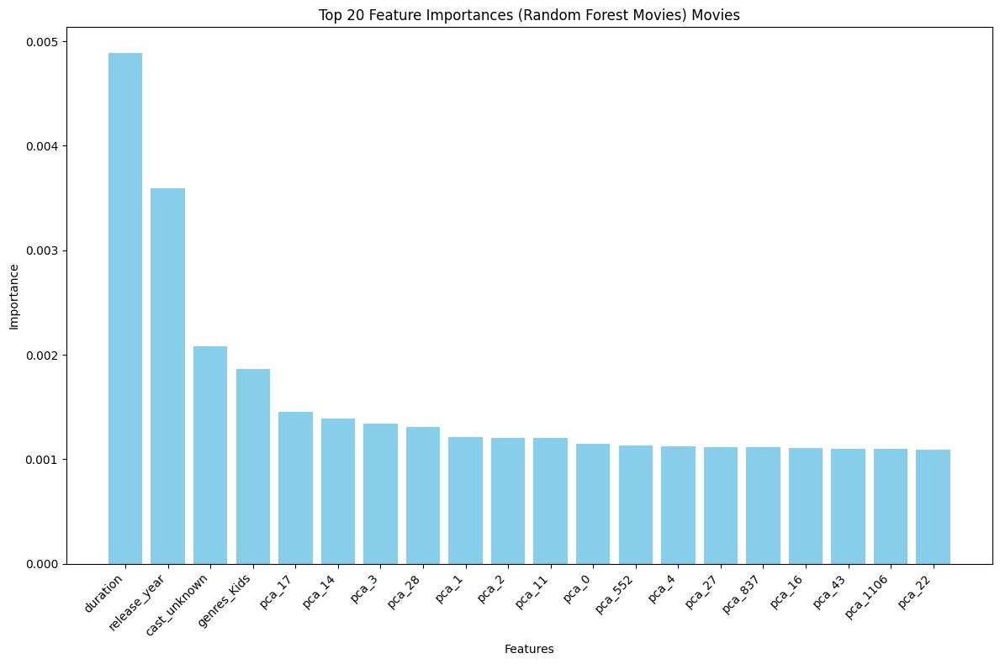

In [ ]:
importances_rf_movies = rf_model_movies.feature_importances_
feature_names_rf_movies = X_train_movies.columns

feature_names_rf_movies = np.array(feature_names_rf_movies)

num_features_to_plot = 20  
indices = np.argsort(importances_rf_movies)[-num_features_to_plot:][::-1] 

plt.figure(figsize=(12, 8)) 
plt.bar(range(num_features_to_plot), importances_rf_movies[indices], align='center', color='skyblue')
plt.xticks(range(num_features_to_plot), feature_names_rf_movies[indices], rotation=45, ha='right') 
plt.title("Top 20 Feature Importances (Random Forest Movies) Movies")
plt.xlabel("Features")
plt.ylabel("Importance")
plt.tight_layout() 
plt.show()

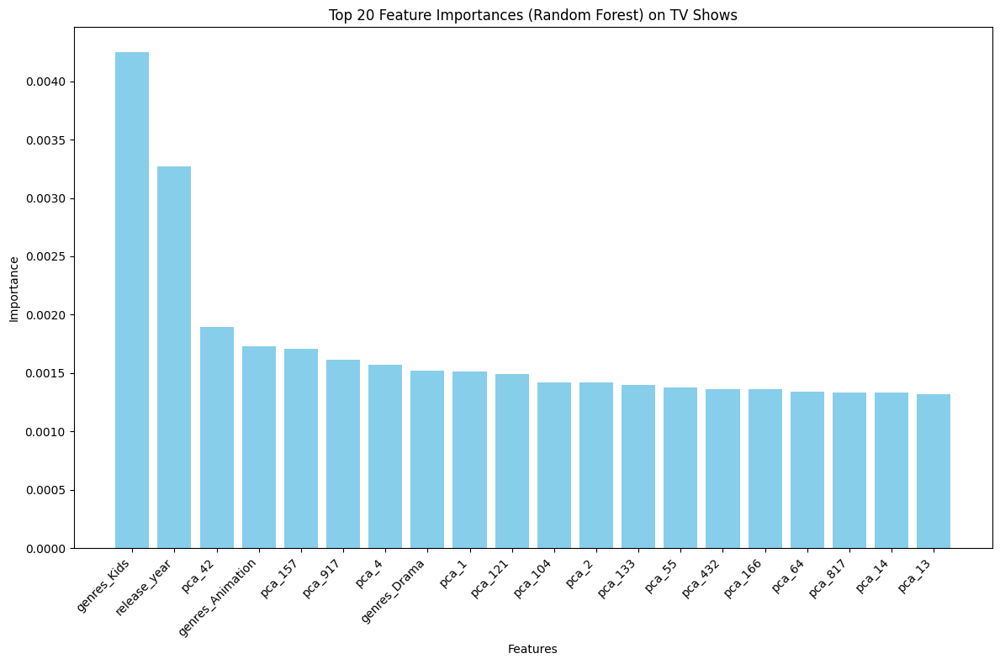

In [ ]:
importances_rf_tv = rf_model_tv.feature_importances_
feature_names_rf_tv = X_train_tv.columns

feature_names_rf_tv = np.array(feature_names_rf_tv)

num_features_to_plot = 20  
indices = np.argsort(importances_rf_tv)[-num_features_to_plot:][::-1]

plt.figure(figsize=(12, 8))  
plt.bar(range(num_features_to_plot), importances_rf_tv[indices], align='center', color='skyblue')
plt.xticks(range(num_features_to_plot), feature_names_rf_tv[indices], rotation=45, ha='right')  
plt.title("Top 20 Feature Importances (Random Forest) on TV Shows")
plt.xlabel("Features")
plt.ylabel("Importance")
plt.tight_layout()  
plt.show()

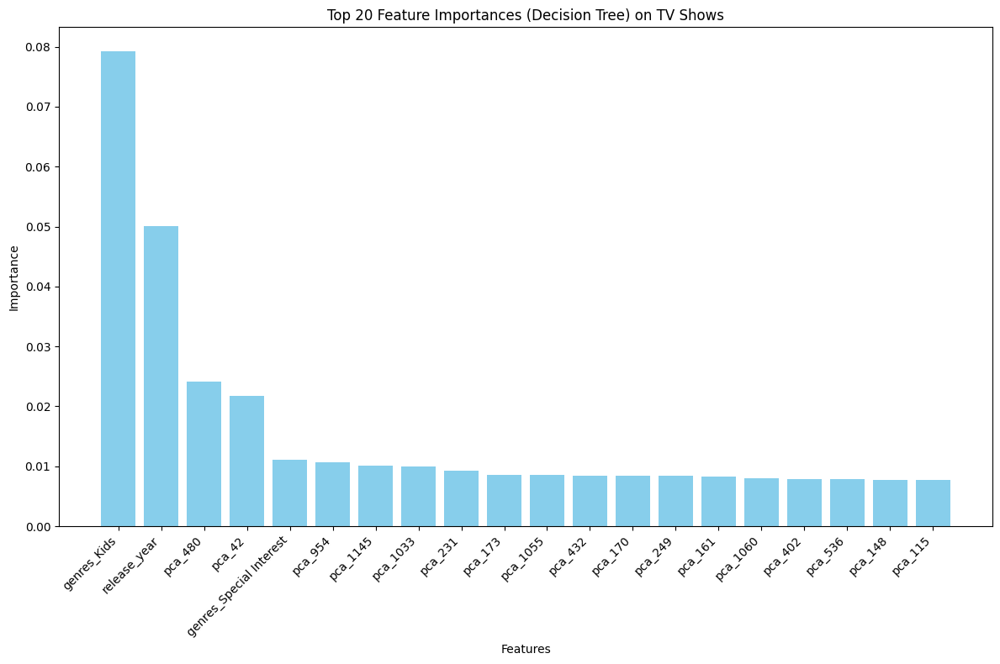

In [ ]:
importances_dt_tv = dt_tv.feature_importances_
feature_names_dt_tv = X_train_tv.columns

feature_names_dt_tv = np.array(feature_names_dt_tv)

num_features_to_plot = 20  
indices = np.argsort(importances_dt_tv)[-num_features_to_plot:][::-1]  

plt.figure(figsize=(12, 8))  
plt.bar(range(num_features_to_plot), importances_dt_tv[indices], align='center', color='skyblue')
plt.xticks(range(num_features_to_plot), feature_names_dt_tv[indices], rotation=45, ha='right')  
plt.title("Top 20 Feature Importances (Decision Tree) on TV Shows")
plt.xlabel("Features")
plt.ylabel("Importance")
plt.tight_layout()  
plt.show()

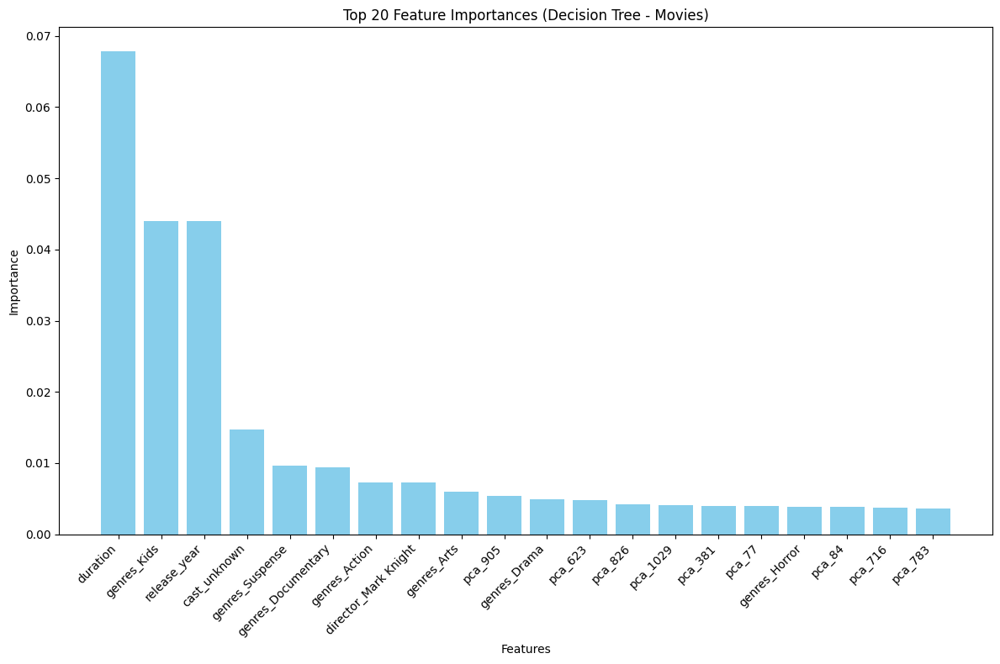

In [ ]:
importances_dt_movies = dt_movies.feature_importances_
feature_names_dt_movies = X_train_movies.columns

feature_names_dt_movies = np.array(feature_names_dt_movies)

num_features_to_plot = 20 
indices = np.argsort(importances_dt_movies)[-num_features_to_plot:][::-1]

plt.figure(figsize=(12, 8))  
plt.bar(range(num_features_to_plot), importances_dt_movies[indices], align='center', color='skyblue')
plt.xticks(range(num_features_to_plot), feature_names_dt_movies[indices], rotation=45, ha='right')  
plt.title("Top 20 Feature Importances (Decision Tree - Movies)")
plt.xlabel("Features")
plt.ylabel("Importance")
plt.tight_layout()
plt.show()


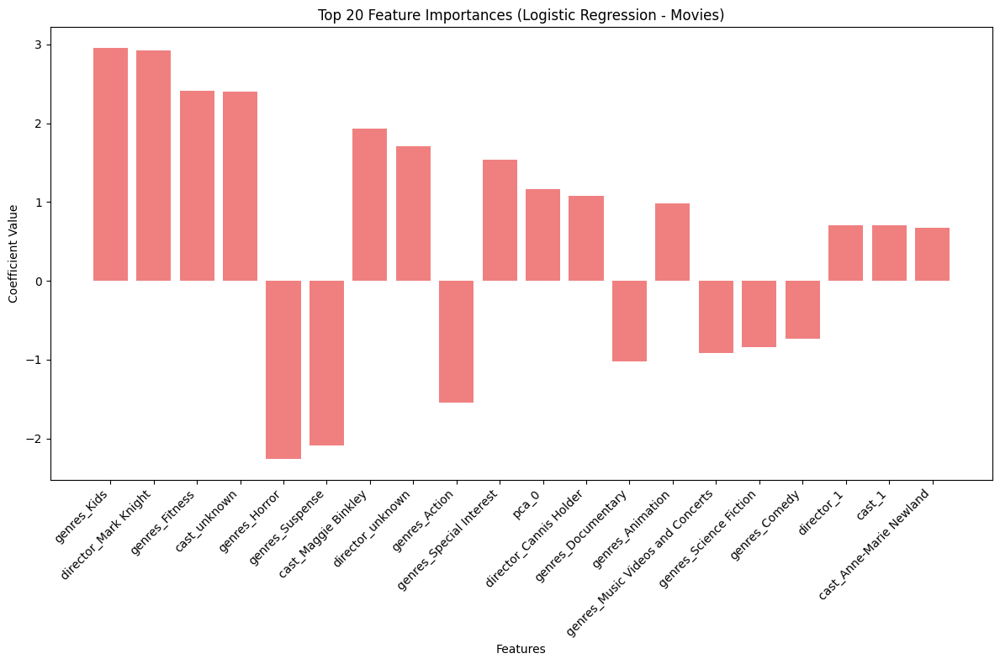

In [ ]:
coefficients_lr_movies = lr_movies.coef_[0]  
feature_names_lr_movies = X_train_movies.columns


feature_names_lr_movies = np.array(feature_names_lr_movies)


num_features_to_plot = 20 
indices = np.argsort(np.abs(coefficients_lr_movies))[-num_features_to_plot:][::-1]

# Plot
plt.figure(figsize=(12, 8))
plt.bar(range(num_features_to_plot), coefficients_lr_movies[indices], align='center', color='lightcoral')
plt.xticks(range(num_features_to_plot), feature_names_lr_movies[indices], rotation=45, ha='right')
plt.title("Top 20 Feature Importances (Logistic Regression - Movies)")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.tight_layout()
plt.show()


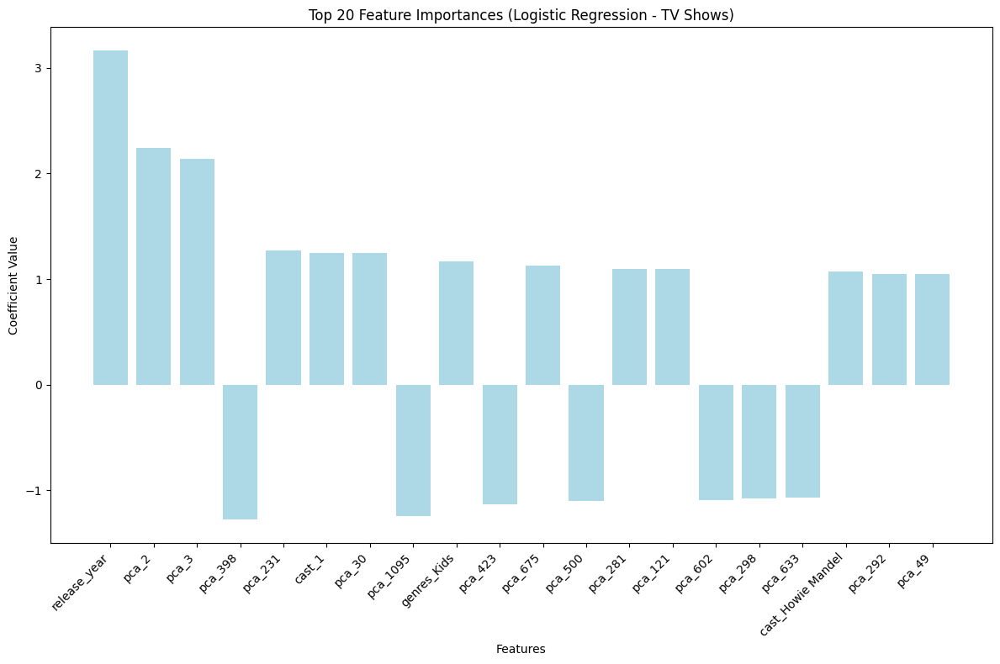

In [ ]:
coefficients_lr_tv = lr_tv.coef_[0] 
feature_names_lr_tv = X_train_tv.columns

feature_names_lr_tv = np.array(feature_names_lr_tv)

num_features_to_plot = 20 
indices = np.argsort(np.abs(coefficients_lr_tv))[-num_features_to_plot:][::-1]

plt.figure(figsize=(12, 8))
plt.bar(range(num_features_to_plot), coefficients_lr_tv[indices], align='center', color='lightblue')
plt.xticks(range(num_features_to_plot), feature_names_lr_tv[indices], rotation=45, ha='right')
plt.title("Top 20 Feature Importances (Logistic Regression - TV Shows)")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.tight_layout()
plt.show()


In [70]:
df_movies.head()

,type,release_year,rating,duration,genres_Action,genres_Adventure,genres_Animation,genres_Anime,genres_Arthouse,genres_Arts,...,pca_1200,pca_1201,pca_1202,pca_1203,pca_1204,pca_1205,pca_1206,pca_1207,pca_1208,pca_1209
0,0,0.930693,2,113,0,0,0,0,0,0,...,-0.019580,0.002006,-0.021769,0.012715,-0.012419,-0.034108,-0.000808,-0.003879,0.012129,0.008466
1,0,0.970297,4,110,0,0,0,0,0,0,...,0.022286,-0.007266,-0.003036,-0.019193,-0.002223,-0.003940,-0.002930,-0.001030,0.031273,0.028162
2,0,0.960396,2,74,1,0,0,0,0,0,...,-0.002470,-0.023054,-0.013526,0.011243,-0.018410,-0.004977,-0.018703,0.023788,-0.004137,0.012253
3,0,0.930693,2,69,0,0,0,0,0,0,...,0.006008,-0.024452,-0.008022,0.003428,-0.009113,-0.002491,-0.014355,-0.017071,0.000768,-0.004035
4,0,0.683168,2,45,0,0,0,0,0,0,...,0.009018,0.012132,-0.013604,-0.013060,-0.013998,0.012497,0.007594,-0.001964,-0.026650,-0.011425


# Selected Features
Based on the results above, the most important features are as follows:

Selected Features for Movies:
1. genres
2. description
3. release_year
4. duration

Selected Features for TV Shows:
1. genres
2. description
3. release_year

In [71]:
len(df_movies.columns)

39312

In [72]:
len(df_tv.columns)

39312

In [ ]:
director_features = [col for col in df_movies.columns if col.startswith('director')]

df_movies = df_movies.drop(columns=director_features)
df_tv = df_tv.drop(columns=director_features)

cast_features = [col for col in df_tv.columns if col.startswith('cast')]

df_tv = df_tv.drop(columns=cast_features + ['duration'])
df_movies = df_movies.drop(columns=cast_features)

In [74]:
len(df_movies.columns)

1245

In [75]:
len(df_tv.columns)

1244

In [ ]:
X_movies = df_movies.drop(columns=['rating'])
y_movies = df_movies['rating'].astype(int)

X_train_movies, X_test_movies, y_train_movies, y_test_movies = train_test_split(X_movies, y_movies, test_size=0.2, random_state=42, stratify = df_movies['rating'])

X_tv = df_tv.drop(columns=['rating'])
y_tv = df_tv['rating'].astype(int)

X_train_tv, X_test_tv, y_train_tv, y_test_tv = train_test_split(X_tv, y_tv, test_size=0.2, random_state=42, stratify = df_tv['rating'])

In [77]:
from imblearn.over_sampling import SMOTE

smote_movies = SMOTE(random_state = 42)

smote_tv = SMOTE(random_state = 43)

X_train_movies, y_train_movies = smote_movies.fit_resample(X_train_movies, y_train_movies)
X_train_tv, y_train_tv = smote_tv.fit_resample(X_train_tv, y_train_tv)

In [ ]:
rf_model_movies = RandomForestClassifier(random_state=42)

rf_model_movies.fit(X_train_movies, y_train_movies)

RandomForestClassifier(random_state=42)

In [ ]:
rf_model_tv = RandomForestClassifier(random_state=42)

rf_model_tv.fit(X_train_tv, y_train_tv)

RandomForestClassifier(random_state=42)

Random Forest Report on Movies: 
              precision    recall  f1-score   support

           0       0.68      0.59      0.64       216
           1       0.32      0.30      0.31       221
           2       0.31      0.21      0.25       170
           3       0.20      0.02      0.04        51
           4       0.35      0.40      0.37       448
           5       0.43      0.51      0.46       457

    accuracy                           0.41      1563
   macro avg       0.38      0.34      0.34      1563
weighted avg       0.41      0.41      0.40      1563

Random Forest Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.56      0.52      0.54        84
           1       0.53      0.84      0.65       150
           2       0.00      0.00      0.00        16
           3       0.12      0.07      0.09        45
           4       0.50      0.18      0.26        34
           5       0.50      0.13      0.21        15
          

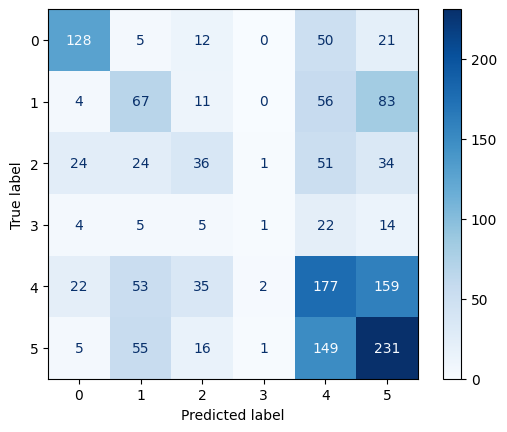

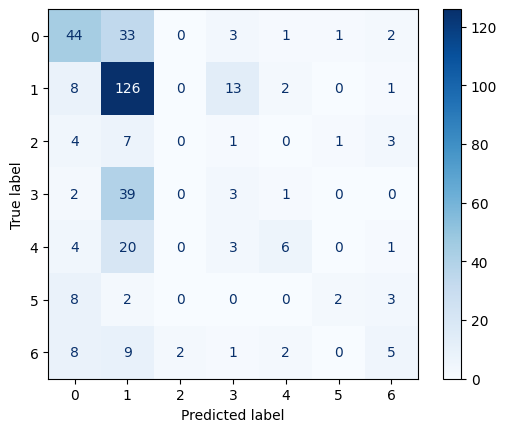

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_pred_movies = rf_model_movies.predict(X_test_movies)
y_pred_tv = rf_model_tv.predict(X_test_tv)

cm_movies = confusion_matrix(y_test_movies, y_pred_movies)
cm_tv = confusion_matrix(y_test_tv, y_pred_tv)

disp_movies = ConfusionMatrixDisplay(confusion_matrix=cm_movies, display_labels=rf_model_movies.classes_)
disp_movies.plot(cmap='Blues')  

disp_tv = ConfusionMatrixDisplay(confusion_matrix=cm_tv, display_labels=rf_model_tv.classes_)
disp_tv.plot(cmap='Blues') 

print(f"Random Forest Report on Movies: \n{report_movies}")
print(f"Random Forest Report on TV Shows: \n{report_tv}")

In [82]:
from sklearn.linear_model import LogisticRegression

lr_movies = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=42)
lr_movies.fit(X_train_movies, y_train_movies)

lr_tv = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state=42)
lr_tv.fit(X_train_tv, y_train_tv)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'mul

LogisticRegression(multi_class='multinomial', random_state=42)

Logistic Regression Report on Movies: 
              precision    recall  f1-score   support

           0       0.60      0.57      0.59       216
           1       0.30      0.44      0.36       221
           2       0.26      0.19      0.22       170
           3       0.06      0.20      0.09        51
           4       0.36      0.29      0.32       448
           5       0.44      0.37      0.40       457

    accuracy                           0.36      1563
   macro avg       0.34      0.34      0.33      1563
weighted avg       0.39      0.36      0.37      1563

Logistic Regression Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.70      0.58      0.64        84
           1       0.62      0.51      0.56       150
           2       0.27      0.25      0.26        16
           3       0.31      0.42      0.36        45
           4       0.26      0.41      0.32        34
           5       0.33      0.40      0.36        1

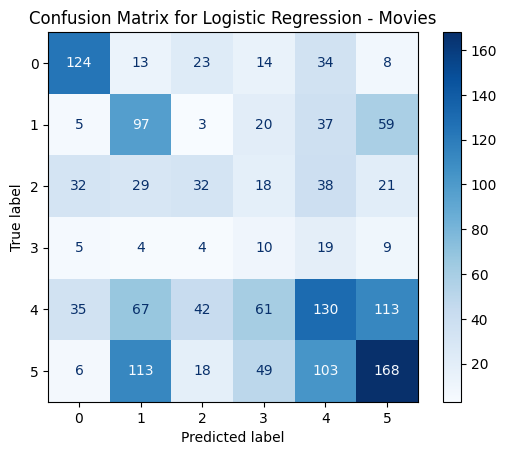

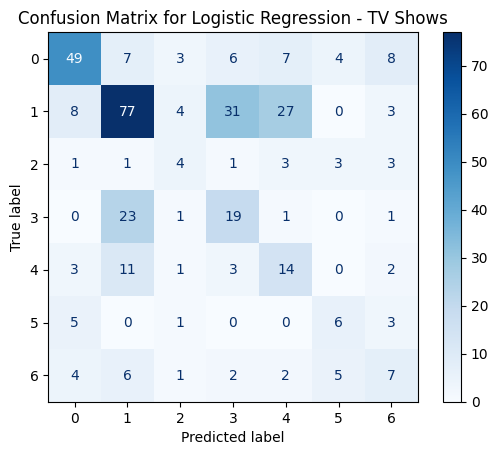

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_lr_movies = confusion_matrix(y_test_movies, y_pred_lr_movies)
cm_lr_tv = confusion_matrix(y_test_tv, y_pred_lr_tv)

disp_lr_movies = ConfusionMatrixDisplay(confusion_matrix=cm_lr_movies, display_labels=lr_movies.classes_)
disp_lr_movies.plot(cmap='Blues')  
disp_lr_movies.ax_.set_title("Confusion Matrix for Logistic Regression - Movies")

disp_lr_tv = ConfusionMatrixDisplay(confusion_matrix=cm_lr_tv, display_labels=lr_tv.classes_)
disp_lr_tv.plot(cmap='Blues') 
disp_lr_tv.ax_.set_title("Confusion Matrix for Logistic Regression - TV Shows")

print(f"Logistic Regression Report on Movies: \n{lr_movies_report}")
print(f"Logistic Regression Report on TV Shows: \n{lr_tv_report}")

In [84]:
from sklearn.tree import DecisionTreeClassifier

dt_movies = DecisionTreeClassifier(random_state=42)
dt_tv = DecisionTreeClassifier(random_state=42)

dt_movies.fit(X_train_movies, y_train_movies)
y_pred_movies = dt_movies.predict(X_test_movies)

dt_tv.fit(X_train_tv, y_train_tv)
y_pred_tv = dt_tv.predict(X_test_tv)

Decision Tree Report on Movies: 
              precision    recall  f1-score   support

           0       0.57      0.60      0.58       216
           1       0.25      0.32      0.28       221
           2       0.18      0.24      0.20       170
           3       0.08      0.14      0.10        51
           4       0.35      0.29      0.32       448
           5       0.42      0.32      0.36       457

    accuracy                           0.34      1563
   macro avg       0.31      0.32      0.31      1563
weighted avg       0.36      0.34      0.34      1563

Decision Tree Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.34      0.31      0.33        84
           1       0.54      0.40      0.46       150
           2       0.22      0.44      0.29        16
           3       0.15      0.18      0.16        45
           4       0.28      0.26      0.27        34
           5       0.32      0.53      0.40        15
          

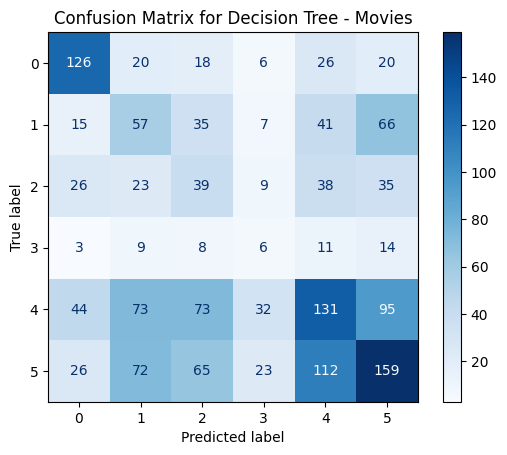

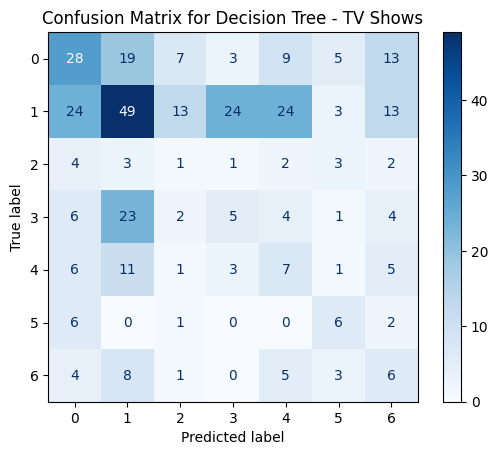

In [ ]:

y_pred_dt_movies = dt_movies.predict(X_test_movies)
y_pred_dt_tv = dt_tv.predict(X_test_tv)

cm_dt_movies = confusion_matrix(y_test_movies, y_pred_dt_movies)
cm_dt_tv = confusion_matrix(y_test_tv, y_pred_dt_tv)

disp_dt_movies = ConfusionMatrixDisplay(confusion_matrix=cm_dt_movies, display_labels=dt_movies.classes_)
disp_dt_movies.plot(cmap='Blues')  
disp_dt_movies.ax_.set_title("Confusion Matrix for Decision Tree - Movies")

disp_dt_tv = ConfusionMatrixDisplay(confusion_matrix=cm_dt_tv, display_labels=dt_tv.classes_)
disp_dt_tv.plot(cmap='Blues')  
disp_dt_tv.ax_.set_title("Confusion Matrix for Decision Tree - TV Shows")

print(f"Decision Tree Report on Movies: \n{dt_movies_report}")
print(f"Decision Tree Report on TV Shows: \n{dt_tv_report}")


In [86]:
from sklearn.naive_bayes import GaussianNB

nb_movies = GaussianNB()
nb_tv = GaussianNB()

nb_movies.fit(X_train_movies, y_train_movies)
y_pred_movies = nb_movies.predict(X_test_movies)

nb_tv.fit(X_train_tv, y_train_tv)
y_pred_tv = nb_tv.predict(X_test_tv)

Naive Bayes Classification Report on Movies: 
              precision    recall  f1-score   support

           0       0.58      0.61      0.59       216
           1       0.33      0.20      0.25       221
           2       0.26      0.19      0.22       170
           3       0.03      0.27      0.05        51
           4       0.51      0.26      0.34       448
           5       0.55      0.46      0.51       457

    accuracy                           0.35      1563
   macro avg       0.38      0.33      0.33      1563
weighted avg       0.46      0.35      0.39      1563

Naive Bayes Classification Report on TV Shows: 
              precision    recall  f1-score   support

           0       0.47      0.20      0.28        84
           1       0.62      0.17      0.26       150
           2       0.07      0.31      0.12        16
           3       0.53      0.18      0.27        45
           4       0.14      0.15      0.14        34
           5       0.09      0.73     

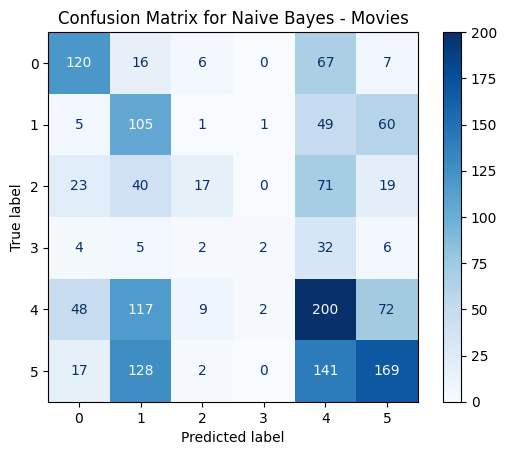

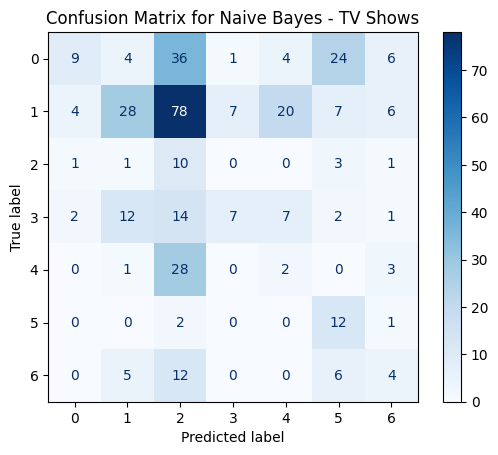

In [ ]:
y_pred_nb_movies = nb_movies.predict(X_test_movies)
y_pred_nb_tv = nb_tv.predict(X_test_tv)

cm_nb_movies = confusion_matrix(y_test_movies, y_pred_nb_movies)
cm_nb_tv = confusion_matrix(y_test_tv, y_pred_nb_tv)

disp_nb_movies = ConfusionMatrixDisplay(confusion_matrix=cm_nb_movies, display_labels=nb_movies.classes_)
disp_nb_movies.plot(cmap='Blues') 
disp_nb_movies.ax_.set_title("Confusion Matrix for Naive Bayes - Movies")

disp_nb_tv = ConfusionMatrixDisplay(confusion_matrix=cm_nb_tv, display_labels=nb_tv.classes_)
disp_nb_tv.plot(cmap='Blues')  
disp_nb_tv.ax_.set_title("Confusion Matrix for Naive Bayes - TV Shows")

print(f"Naive Bayes Classification Report on Movies: \n{nb_report_movies}")
print(f"Naive Bayes Classification Report on TV Shows: \n{nb_report_tv}")


# Conclusion
This notebook demonstrates a comprehensive workflow from data cleaning to model evaluation for predicting age ratings. Future work may involve experimenting with additional features or models to improve performance.
